$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 2: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File /home/avia.avraham/.pytorch-datasets/George_W_Bush2.zip exists, skipping download.
Extracting /home/avia.avraham/.pytorch-datasets/George_W_Bush2.zip...
Extracted 532 to /home/avia.avraham/.pytorch-datasets/George_W_Bush/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


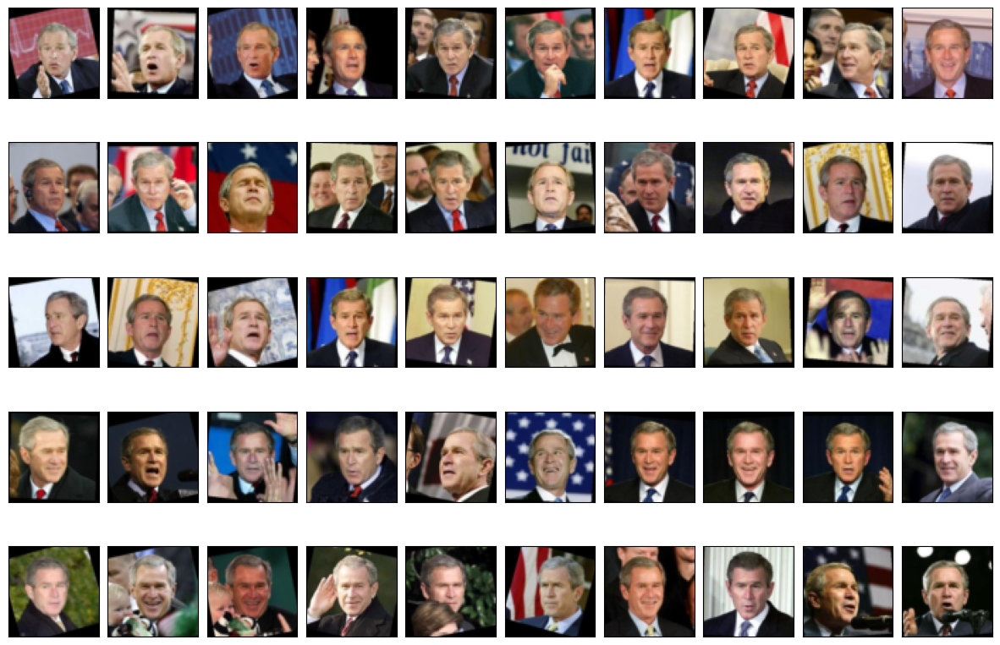

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [6]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (encoder): EncoderCNN(
    (cnn): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU()
      (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (8): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU()
      (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): B

**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [11]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (linear): Linear(in_features=128, out_features=2048, bias=True)
  (decoder): Sequential(
    (0): ConvTranspose2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(32, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): Tanh()
  )
)
torch.Size([1, 3, 64, 64])


### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [13]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [23]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

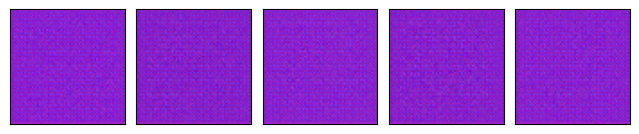

In [24]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [25]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 64, 'h_dim': 128, 'z_dim': 100, 'x_sigma2': 1.0, 'learn_rate': 0.0002, 'betas': (0.5, 0.999), 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'data_label': 0, 'label_noise': 0.15}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|██████████| 9/9 [00:02<00:00,  3.90it/s]
Discriminator loss: 0.217623141904672
Generator loss:     0.7031072643068101


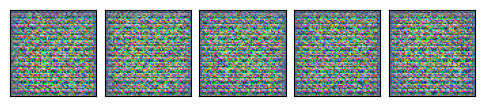

--- EPOCH 2/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.63it/s]
Discriminator loss: 0.10695966250366634
Generator loss:     1.5537525879012213


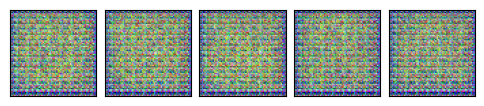

--- EPOCH 3/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.59it/s]
Discriminator loss: 0.08995089203947121
Generator loss:     1.8923208051257663


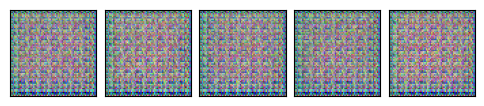

--- EPOCH 4/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.73it/s]
Discriminator loss: 0.04881490353080961
Generator loss:     0.7042516469955444


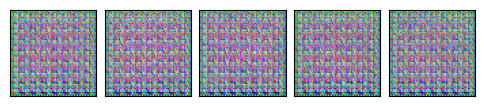

--- EPOCH 5/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.49it/s]
Discriminator loss: 0.009174078289005492
Generator loss:     0.6504312753677368
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


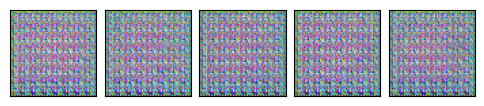

--- EPOCH 6/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.50it/s]
Discriminator loss: 0.005748240070210563
Generator loss:     0.7251642511950599


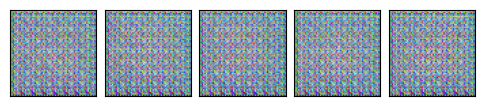

--- EPOCH 7/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.43it/s]
Discriminator loss: 0.015380277815792296
Generator loss:     0.2746458368168937


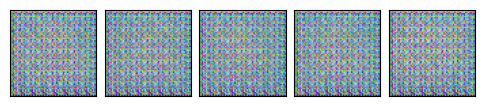

--- EPOCH 8/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.57it/s]
Discriminator loss: -0.0012392339607079823
Generator loss:     0.2565390260683166


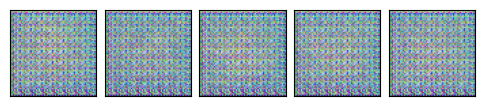

--- EPOCH 9/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.49it/s]
Discriminator loss: -0.008106251868108908
Generator loss:     0.13117292150855064


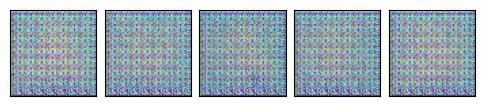

--- EPOCH 10/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.41it/s]
Discriminator loss: -0.022284144949581888
Generator loss:     0.08594650526841481
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


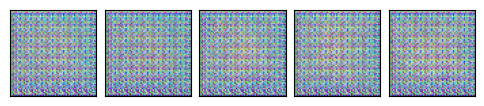

--- EPOCH 11/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.53it/s]
Discriminator loss: 0.0194363035261631
Generator loss:     0.15133755364351803


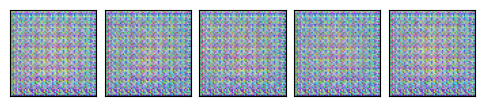

--- EPOCH 12/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.48it/s]
Discriminator loss: -0.0013156522893243367
Generator loss:     0.20008828739325205


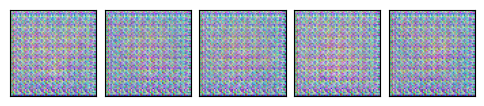

--- EPOCH 13/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.67it/s]
Discriminator loss: -0.000780248704055945
Generator loss:     0.08944667544629839


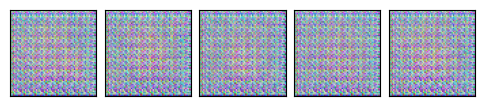

--- EPOCH 14/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.55it/s]
Discriminator loss: -0.005039716139435768
Generator loss:     0.07536410209205416


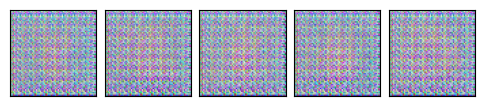

--- EPOCH 15/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.57it/s]
Discriminator loss: -0.00824303635292583
Generator loss:     0.01140623539686203
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


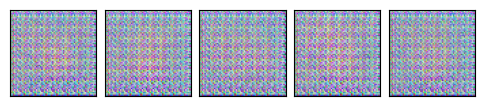

--- EPOCH 16/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.08it/s]
Discriminator loss: 0.006449609580967162
Generator loss:     0.012612896660963694


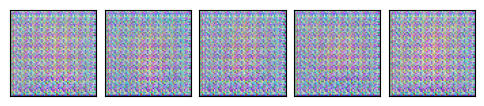

--- EPOCH 17/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.45it/s]
Discriminator loss: 0.012211084365844727
Generator loss:     0.026889017058743372


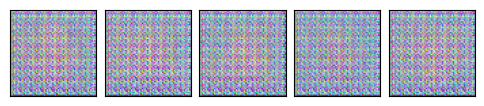

--- EPOCH 18/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.54it/s]
Discriminator loss: 0.015676567123995885
Generator loss:     0.032455254139171705


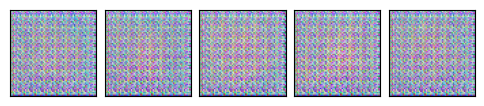

--- EPOCH 19/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.44it/s]
Discriminator loss: -0.03213702514767647
Generator loss:     0.005255257710814476


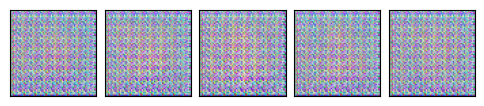

--- EPOCH 20/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.55it/s]
Discriminator loss: 0.0024054735485050413
Generator loss:     0.060929404739807874
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


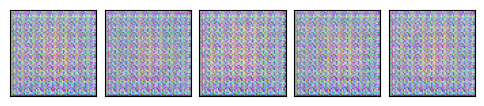

--- EPOCH 21/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.57it/s]
Discriminator loss: 0.008003212097618315
Generator loss:     0.014406379519237412


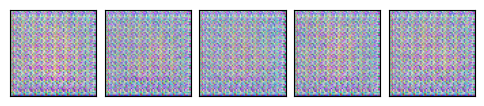

--- EPOCH 22/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.46it/s]
Discriminator loss: -0.00797721826367908
Generator loss:     0.011152189638879564


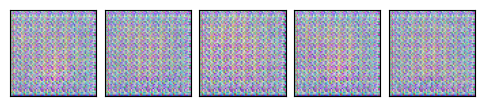

--- EPOCH 23/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.56it/s]
Discriminator loss: -0.05877951987915569
Generator loss:     0.21856513288285997


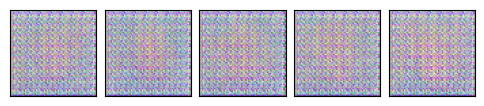

--- EPOCH 24/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.33it/s]
Discriminator loss: 0.007875580340623856
Generator loss:     0.02932083557566835


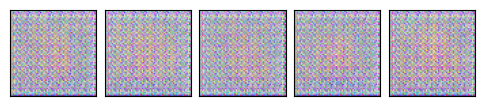

--- EPOCH 25/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.54it/s]
Discriminator loss: 0.004444099962711334
Generator loss:     0.000704979912067453
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


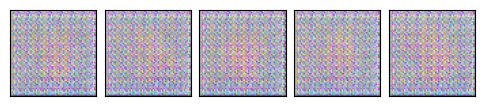

--- EPOCH 26/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.48it/s]
Discriminator loss: 0.031101033091545105
Generator loss:     0.00034624448542470217


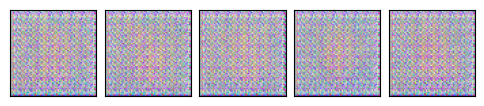

--- EPOCH 27/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.35it/s]
Discriminator loss: 0.00519636438952552
Generator loss:     0.0009549008164968756


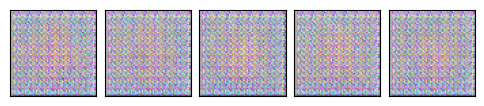

--- EPOCH 28/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.58it/s]
Discriminator loss: 0.020649263428317174
Generator loss:     0.01482986162106196


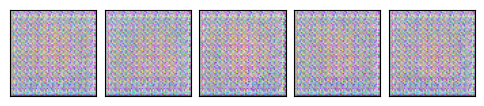

--- EPOCH 29/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.52it/s]
Discriminator loss: 0.04146432483361827
Generator loss:     0.008894298768912753


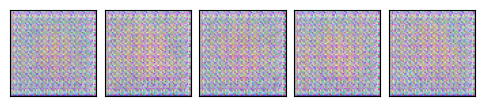

--- EPOCH 30/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.68it/s]
Discriminator loss: 0.009464354771706793
Generator loss:     0.011403996497392654
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


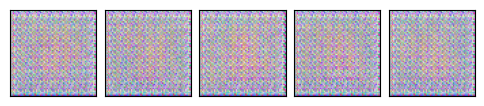

--- EPOCH 31/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.44it/s]
Discriminator loss: 0.04704663695560561
Generator loss:     0.021242089569568634


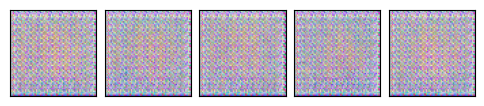

--- EPOCH 32/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.59it/s]
Discriminator loss: 0.002054747607972887
Generator loss:     0.045499559284912214


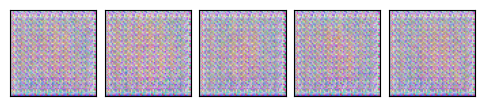

--- EPOCH 33/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.68it/s]
Discriminator loss: -0.004433808848261833
Generator loss:     0.011956563633349206


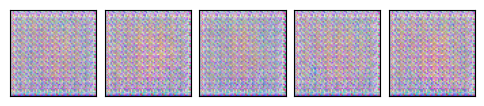

--- EPOCH 34/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.45it/s]
Discriminator loss: 0.061708726816707186
Generator loss:     0.005253377750503003


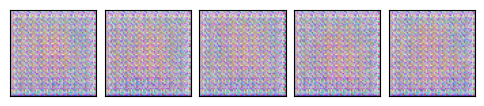

--- EPOCH 35/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.60it/s]
Discriminator loss: 0.02414753929608398
Generator loss:     0.08223571669724253
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


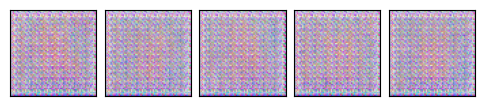

--- EPOCH 36/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.47it/s]
Discriminator loss: 0.019745211427410442
Generator loss:     0.02079677887053953


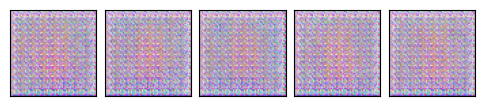

--- EPOCH 37/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.68it/s]
Discriminator loss: 0.024133378225896094
Generator loss:     0.002546109000427855


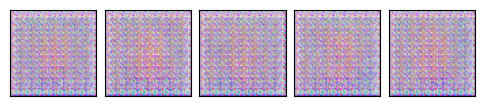

--- EPOCH 38/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.54it/s]
Discriminator loss: -0.011114142628179656
Generator loss:     0.0031340194141699206


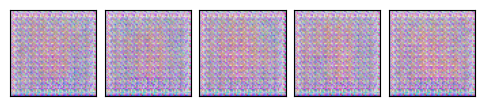

--- EPOCH 39/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.44it/s]
Discriminator loss: -0.015328664746549394
Generator loss:     0.05199305092295011


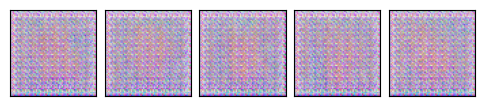

--- EPOCH 40/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.60it/s]
Discriminator loss: -0.03172225919034746
Generator loss:     0.0694064214411709
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


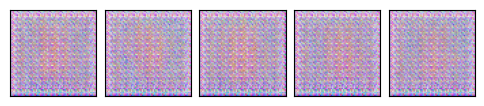

--- EPOCH 41/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.46it/s]
Discriminator loss: -0.04485804339249929
Generator loss:     0.16681145752469698


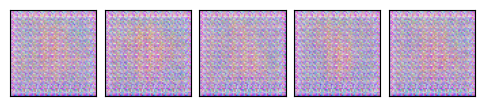

--- EPOCH 42/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.62it/s]
Discriminator loss: -0.029139786544773314
Generator loss:     0.10380693814820713


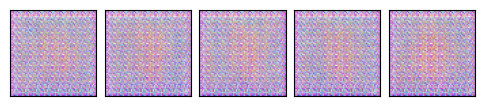

--- EPOCH 43/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.46it/s]
Discriminator loss: 0.02196688660316997
Generator loss:     0.035562746640708714


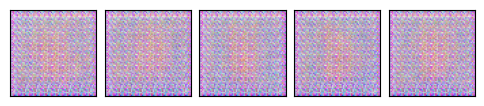

--- EPOCH 44/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.59it/s]
Discriminator loss: -0.07518932181927893
Generator loss:     0.05312627854032649


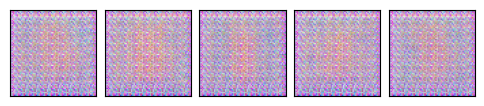

--- EPOCH 45/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.60it/s]
Discriminator loss: 0.0011778544220659467
Generator loss:     0.016929548647668626
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


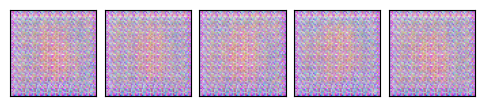

--- EPOCH 46/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.27it/s]
Discriminator loss: 0.039706690029965505
Generator loss:     0.036275754010097847


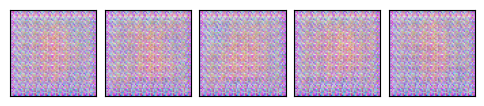

--- EPOCH 47/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.60it/s]
Discriminator loss: 0.05205456167459488
Generator loss:     0.0005384864814459434


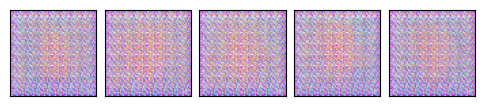

--- EPOCH 48/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.45it/s]
Discriminator loss: -0.029499357152316306
Generator loss:     5.096381098863074e-06


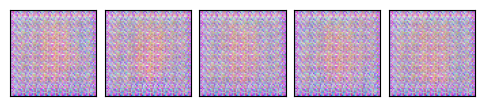

--- EPOCH 49/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.63it/s]
Discriminator loss: -0.08386185102992588
Generator loss:     0.0003990859388270312


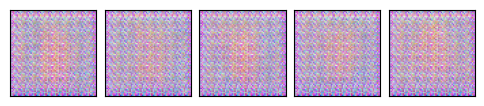

--- EPOCH 50/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.65it/s]
Discriminator loss: 0.0009304115341769324
Generator loss:     0.0006757891840404934
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


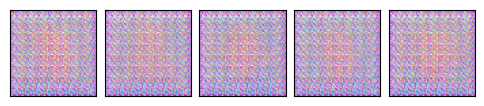

--- EPOCH 51/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.63it/s]
Discriminator loss: -0.006891874803437127
Generator loss:     0.00238572024843759


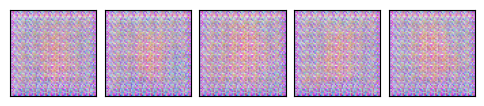

--- EPOCH 52/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.52it/s]
Discriminator loss: 0.07575870595044559
Generator loss:     0.00111750412098546


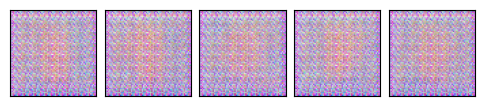

--- EPOCH 53/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.52it/s]
Discriminator loss: -0.06907698636253674
Generator loss:     0.0003622421710234549


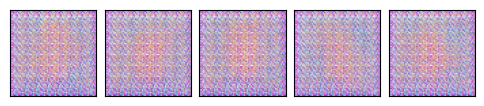

--- EPOCH 54/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.63it/s]
Discriminator loss: 0.07031867818699943
Generator loss:     7.31247815161219e-05


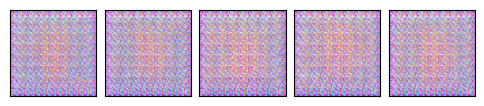

--- EPOCH 55/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.61it/s]
Discriminator loss: -0.009723069767157236
Generator loss:     4.1609929111372265e-05
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


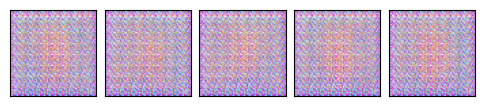

--- EPOCH 56/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.59it/s]
Discriminator loss: 0.04964473098516464
Generator loss:     0.00011095101298350427


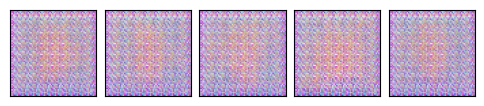

--- EPOCH 57/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.67it/s]
Discriminator loss: -0.13206905416316456
Generator loss:     0.021366231350435153


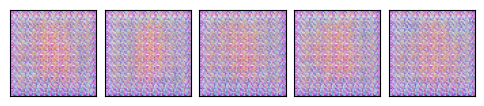

--- EPOCH 58/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.48it/s]
Discriminator loss: 0.012628845456573699
Generator loss:     0.028001062313301697


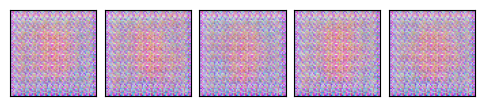

--- EPOCH 59/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.56it/s]
Discriminator loss: 0.0349983564681477
Generator loss:     0.0055205909836028395


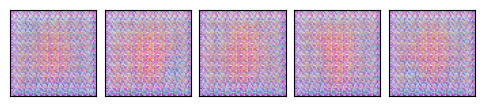

--- EPOCH 60/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.46it/s]
Discriminator loss: -0.10423104961713155
Generator loss:     0.0083862514131599
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


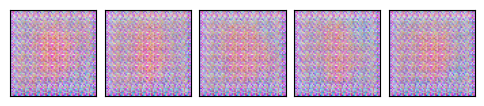

--- EPOCH 61/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.65it/s]
Discriminator loss: 0.01773169305589464
Generator loss:     0.03212689180590031


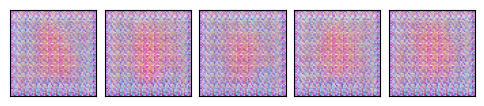

--- EPOCH 62/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.53it/s]
Discriminator loss: 0.0048553844292958575
Generator loss:     0.0017164717428386211


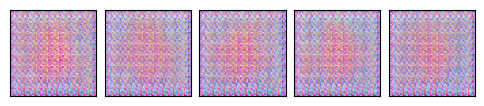

--- EPOCH 63/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.80it/s]
Discriminator loss: 0.0004156641662120819
Generator loss:     0.0016792003571026726


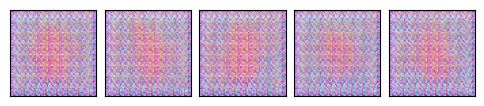

--- EPOCH 64/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.63it/s]
Discriminator loss: -0.014421103729142083
Generator loss:     0.0003664916665810678


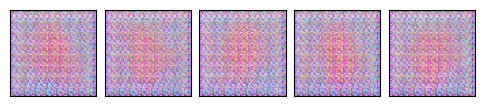

--- EPOCH 65/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.74it/s]
Discriminator loss: 0.049694773016704455
Generator loss:     0.00040935918135195
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


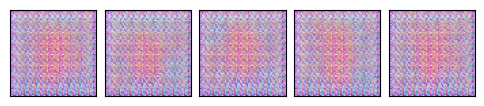

--- EPOCH 66/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.66it/s]
Discriminator loss: -0.01959820629821883
Generator loss:     1.598195528155581e-05


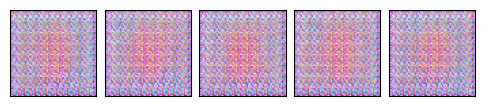

--- EPOCH 67/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.63it/s]
Discriminator loss: -0.01791183091700077
Generator loss:     0.00026019993755552504


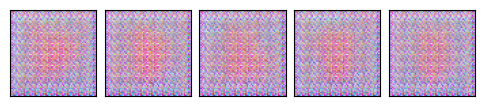

--- EPOCH 68/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.62it/s]
Discriminator loss: 0.008927723599804772
Generator loss:     0.002971301016158476


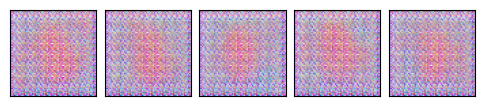

--- EPOCH 69/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.81it/s]
Discriminator loss: -0.036547664966848165
Generator loss:     9.643240466377595e-05


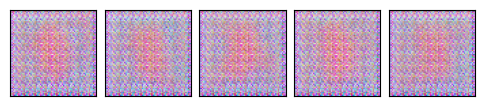

--- EPOCH 70/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.74it/s]
Discriminator loss: 0.049935157514280744
Generator loss:     1.3661421386738462e-05
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


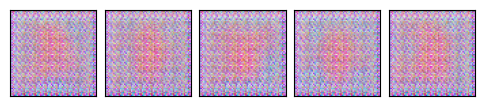

--- EPOCH 71/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.75it/s]
Discriminator loss: -0.08250493970182207
Generator loss:     0.0006044013943109247


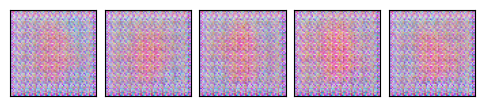

--- EPOCH 72/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.64it/s]
Discriminator loss: -0.10962648606962627
Generator loss:     0.005545785120274458


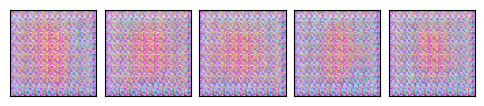

--- EPOCH 73/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.69it/s]
Discriminator loss: 0.012771889567375183
Generator loss:     0.00010998648253411779


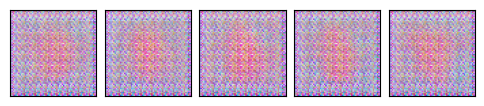

--- EPOCH 74/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.57it/s]
Discriminator loss: 0.009528720130523046
Generator loss:     6.044931999187813e-05


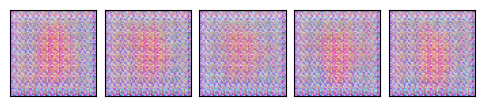

--- EPOCH 75/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.54it/s]
Discriminator loss: -0.06103170414765676
Generator loss:     0.0001483708620071411
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


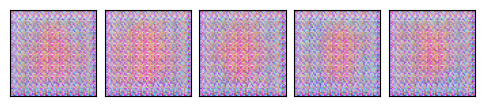

--- EPOCH 76/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.72it/s]
Discriminator loss: -0.021609423475133047
Generator loss:     0.0017288620583713055


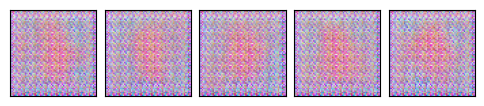

--- EPOCH 77/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.54it/s]
Discriminator loss: -0.06981740478012297
Generator loss:     0.0013838797652473052


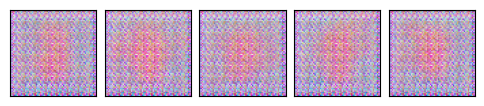

--- EPOCH 78/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.74it/s]
Discriminator loss: -0.02560735907819536
Generator loss:     0.000620121665229413


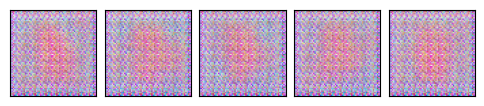

--- EPOCH 79/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.69it/s]
Discriminator loss: 0.09056897751159138
Generator loss:     1.188128450774823e-05


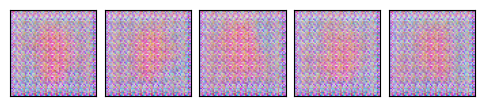

--- EPOCH 80/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.78it/s]
Discriminator loss: 0.05356898821062512
Generator loss:     8.273823833506968e-05
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


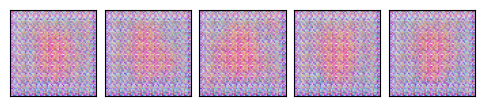

--- EPOCH 81/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.83it/s]
Discriminator loss: 0.017736563665999308
Generator loss:     0.0016212730099343592


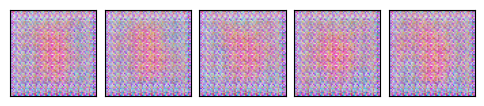

--- EPOCH 82/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.48it/s]
Discriminator loss: 0.02459424402978685
Generator loss:     0.016912074345681403


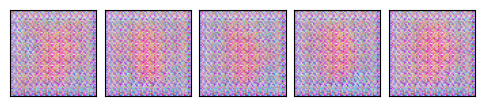

--- EPOCH 83/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.72it/s]
Discriminator loss: 0.06372394226491451
Generator loss:     0.00847299195205172


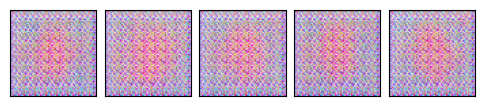

--- EPOCH 84/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.87it/s]
Discriminator loss: -0.019204299483034346
Generator loss:     0.0012872591614723206


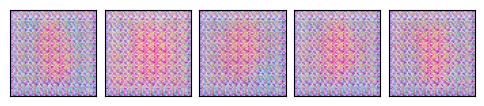

--- EPOCH 85/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.79it/s]
Discriminator loss: 0.027147697905699413
Generator loss:     0.00012346044362251027
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


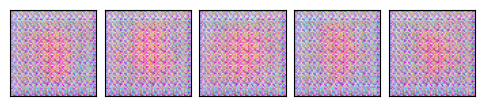

--- EPOCH 86/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.80it/s]
Discriminator loss: 0.12259134898583095
Generator loss:     3.936721218956841e-05


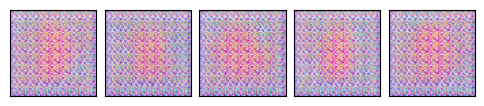

--- EPOCH 87/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.55it/s]
Discriminator loss: -0.06871120880047481
Generator loss:     0.00019939869202466475


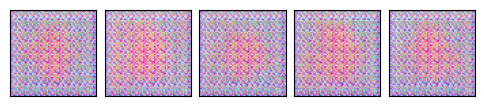

--- EPOCH 88/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.92it/s]
Discriminator loss: 0.028546896245744493
Generator loss:     7.648526904328416e-05


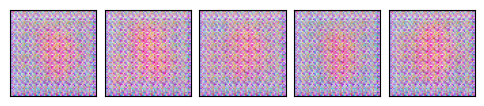

--- EPOCH 89/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.66it/s]
Discriminator loss: -0.03831380191776487
Generator loss:     1.7212128934968656e-05


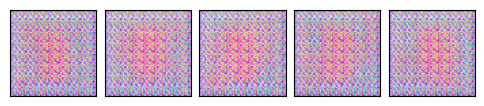

--- EPOCH 90/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.69it/s]
Discriminator loss: -0.017244978497425716
Generator loss:     0.00013005742544515265
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


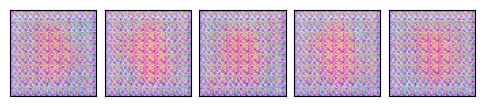

--- EPOCH 91/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.95it/s]
Discriminator loss: 0.0013835993078019884
Generator loss:     0.0037973117497232226


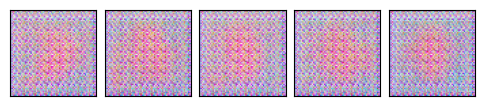

--- EPOCH 92/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.53it/s]
Discriminator loss: 0.058399668584267296
Generator loss:     0.006672150377805035


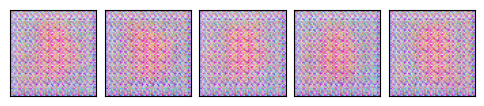

--- EPOCH 93/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.62it/s]
Discriminator loss: 0.09947585314512253
Generator loss:     0.0024526935109558203


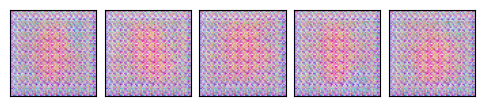

--- EPOCH 94/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.54it/s]
Discriminator loss: 0.0343951013767057
Generator loss:     0.00011089591336915166


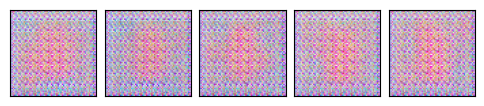

--- EPOCH 95/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.51it/s]
Discriminator loss: -0.03653076829181777
Generator loss:     6.673880559699481e-06
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


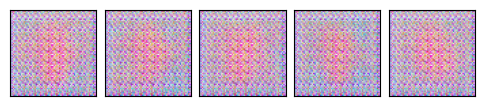

--- EPOCH 96/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.62it/s]
Discriminator loss: 0.009869720372888777
Generator loss:     1.1225541432698567e-06


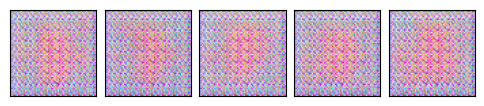

--- EPOCH 97/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.39it/s]
Discriminator loss: -0.009646949668725332
Generator loss:     1.7220959307451267e-06


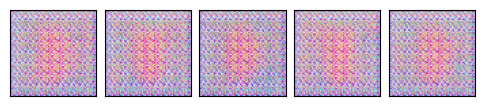

--- EPOCH 98/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.57it/s]
Discriminator loss: 0.0852646604180336
Generator loss:     1.9424307942649142e-05


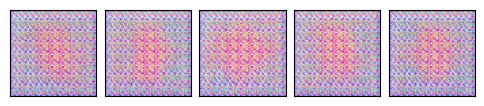

--- EPOCH 99/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.55it/s]
Discriminator loss: -0.08474626888831456
Generator loss:     0.0008181076910760668


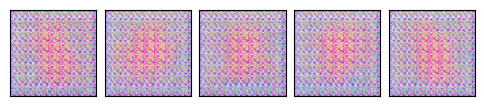

--- EPOCH 100/100 ---
100%|██████████| 9/9 [00:01<00:00,  7.50it/s]
Discriminator loss: -0.002339690923690796
Generator loss:     0.0025836266189192734
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


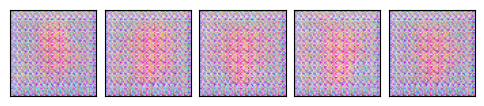

In [27]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

/tmp/ipykernel_1232327/1746051416.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  gen = torch.load(f'{checkpoint_file}.pt', map_location=device)


*** Images Generated from best model:


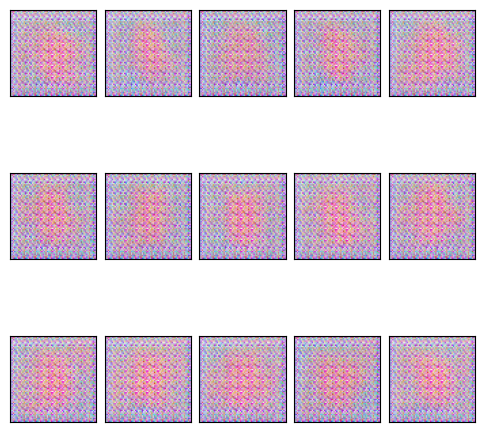

In [28]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [ ]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [ ]:
display_answer(hw3.answers.part2_q1)

### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [ ]:
display_answer(hw3.answers.part2_q2)

### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [ ]:
display_answer(hw3.answers.part2_q3)